I am working on customer churn project where we need to predict if the customer will leave or stay with the company in future based on the features provided.
This is a clssification problem as the outcome is binary.

We learned how to read any unknown data with different visualization skills.
We learned how to make prediction model whether it may be a classification problem or a regression problem.
As a student in Big data analytics I believe the knowledge I gained is a vary good starting point and base to learn everyting in more detail in other subjects. 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

In [2]:
df = pd.read_csv('ppg_churn.csv')

In [3]:
df.shape

(5000, 20)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   state   5000 non-null   object 
 1   X02     5000 non-null   int64  
 2   X03     5000 non-null   object 
 3   X04     5000 non-null   object 
 4   X05     5000 non-null   object 
 5   X06     5000 non-null   int64  
 6   X07     5000 non-null   float64
 7   X08     5000 non-null   int64  
 8   X09     5000 non-null   float64
 9   X10     5000 non-null   float64
 10  X11     5000 non-null   int64  
 11  X12     5000 non-null   float64
 12  X13     5000 non-null   float64
 13  X14     5000 non-null   int64  
 14  X15     5000 non-null   float64
 15  X16     5000 non-null   float64
 16  X17     5000 non-null   int64  
 17  X18     5000 non-null   float64
 18  X19     5000 non-null   int64  
 19  churn   5000 non-null   object 
dtypes: float64(8), int64(7), object(5)
memory usage: 781.4+ KB


In [5]:
df.describe()

,X02,X06,X07,X08,X09,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19
count,5000.00000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,100.25860,7.755200,180.288900,100.029400,30.649668,200.636560,100.191000,17.054322,200.391620,99.919200,9.017732,10.261780,4.435200,2.771196,1.570400
std,39.69456,13.546393,53.894699,19.831197,9.162069,50.551309,19.826496,4.296843,50.527789,19.958686,2.273763,2.761396,2.456788,0.745514,1.306363
min,1.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,73.00000,0.000000,143.700000,87.000000,24.430000,166.375000,87.000000,14.140000,166.900000,87.000000,7.510000,8.500000,3.000000,2.300000,1.000000
50%,100.00000,0.000000,180.100000,100.000000,30.620000,201.000000,100.000000,17.090000,200.400000,100.000000,9.020000,10.300000,4.000000,2.780000,1.000000
75%,127.00000,17.000000,216.200000,113.000000,36.750000,234.100000,114.000000,19.900000,234.700000,113.000000,10.560000,12.000000,6.000000,3.240000,2.000000
max,243.00000,52.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [6]:
df.isna().sum()

state    0
X02      0
X03      0
X04      0
X05      0
X06      0
X07      0
X08      0
X09      0
X10      0
X11      0
X12      0
X13      0
X14      0
X15      0
X16      0
X17      0
X18      0
X19      0
churn    0
dtype: int64

In [7]:
df.isna().sum()

state    0
X02      0
X03      0
X04      0
X05      0
X06      0
X07      0
X08      0
X09      0
X10      0
X11      0
X12      0
X13      0
X14      0
X15      0
X16      0
X17      0
X18      0
X19      0
churn    0
dtype: int64

In [8]:
df.X03.value_counts()

AA    2495
BB    1259
CC    1246
Name: X03, dtype: int64

In [9]:
df.X04.value_counts()

Z1    4527
Z2     473
Name: X04, dtype: int64

In [10]:
df.X05.value_counts()

V2    3677
V1    1323
Name: X05, dtype: int64

In [11]:
df.churn.value_counts()

no     4293
yes     707
Name: churn, dtype: int64

The state variable is an object data type. This it is an categorical variable even though it has 51 unique values

The `X03`,`X04`,`X05` have less than 4 unique values and the `.info()` method revealed these variables are also object data type. So they can also be assumed as categorical variables

The variables `X17` and `X19` have less than 25 unique values and both are integer data types.

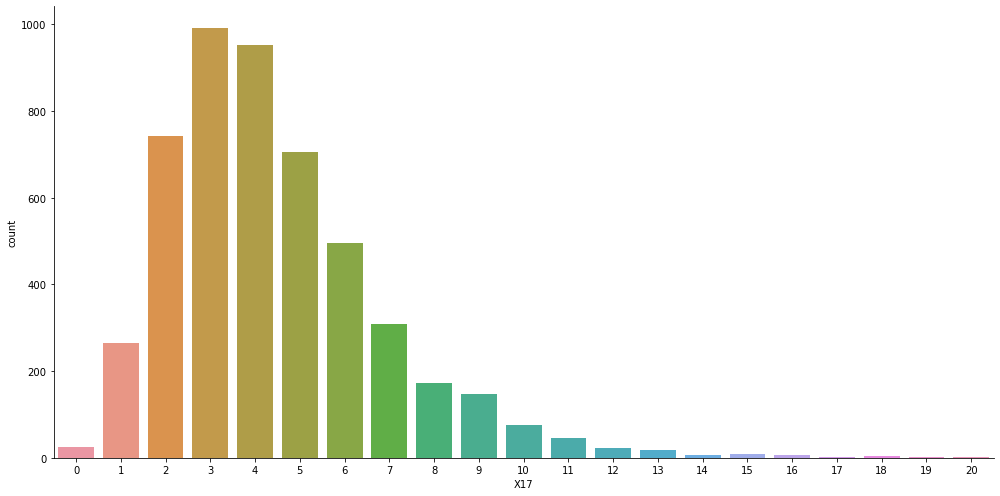

In [12]:
sns.catplot(data=df, x='X17', kind='count', height=7, aspect=2.0)

plt.show()

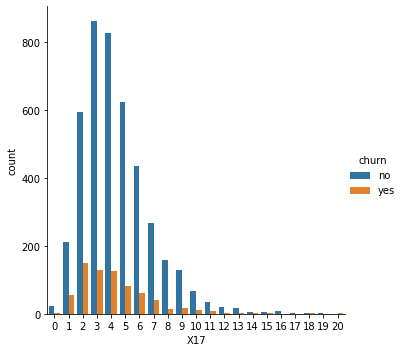

In [13]:
sns.catplot(data=df, x='X17', hue='churn', kind='count')

plt.show()

We can see that the values greater than 7 have very low frequencies.

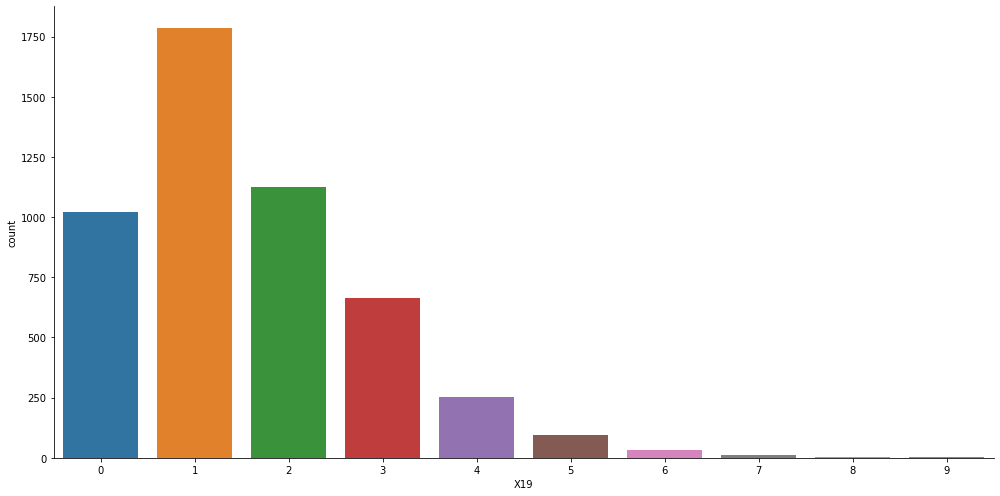

In [14]:
sns.catplot(data=df, x='X19', kind='count', height=7, aspect=2)

plt.show()

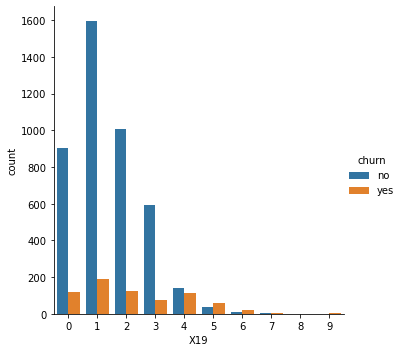

In [15]:
sns.catplot(data=df, x='X19', hue='churn', kind='count')

plt.show()

We can either take `X17` and `X19` as continuos or categorical.

If we want then to be continuous we dont have to change anything.

If we want them to be categorical we can lump then.

In [16]:
df['lump_19'] = np.where(df.X19 > 3, 'Other', df.X19.astype('str'))

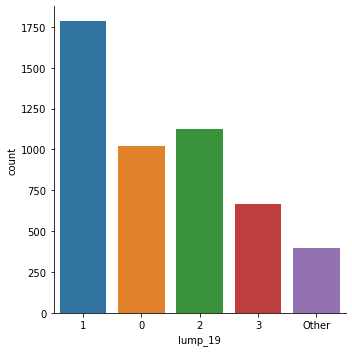

In [17]:
sns.catplot(data=df, x='lump_19', kind='count')

plt.show()

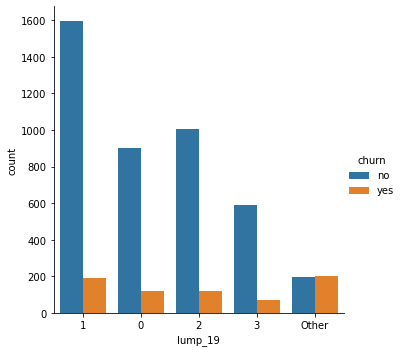

In [18]:
sns.catplot(data=df, x='lump_19', hue='churn', kind='count')

plt.show()

##### For continuous inputs

In [19]:
num_inputs = df.select_dtypes('number').copy().columns.to_list()

In [20]:
num_inputs

['X02',
 'X06',
 'X07',
 'X08',
 'X09',
 'X10',
 'X11',
 'X12',
 'X13',
 'X14',
 'X15',
 'X16',
 'X17',
 'X18',
 'X19']

In [21]:
lf_num = df.melt(id_vars=['churn'], value_vars = num_inputs, ignore_index=True)

In [22]:
lf_num

,churn,variable,value
0,no,X02,128.0
1,no,X02,107.0
2,no,X02,137.0
3,no,X02,84.0
4,no,X02,75.0
...,...,...,...
74995,no,X19,2.0
74996,yes,X19,3.0
74997,no,X19,1.0
74998,no,X19,0.0


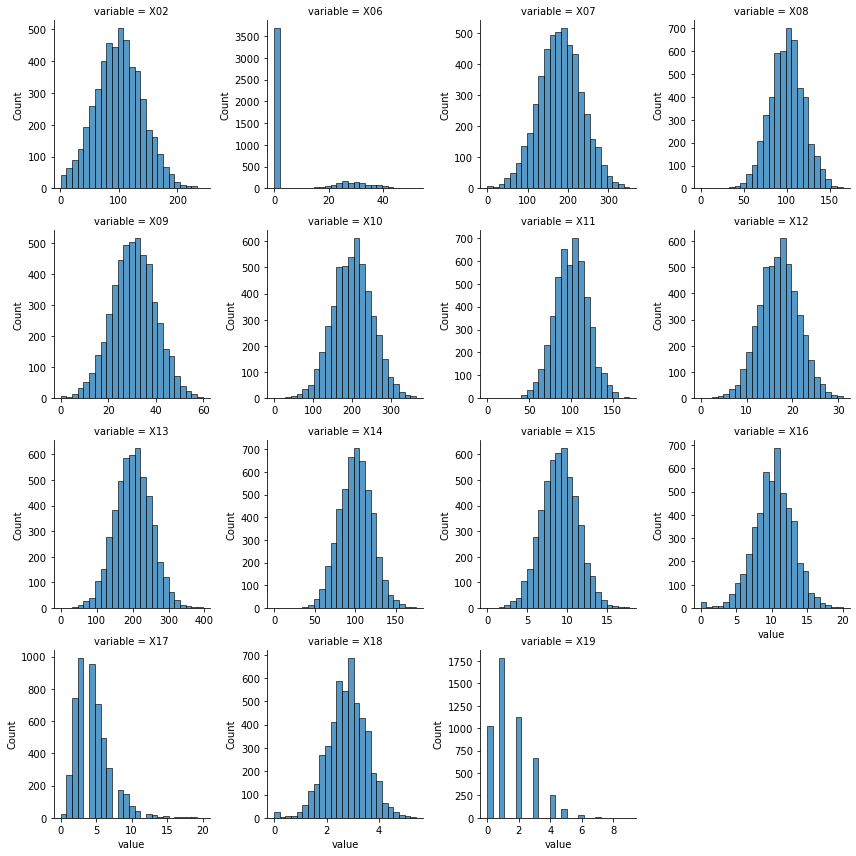

In [23]:
g = sns.FacetGrid(data= lf_num, col='variable', col_wrap=4, sharex=False, sharey=False)

g.map_dataframe(sns.histplot, x='value', bins=25)

plt.show()

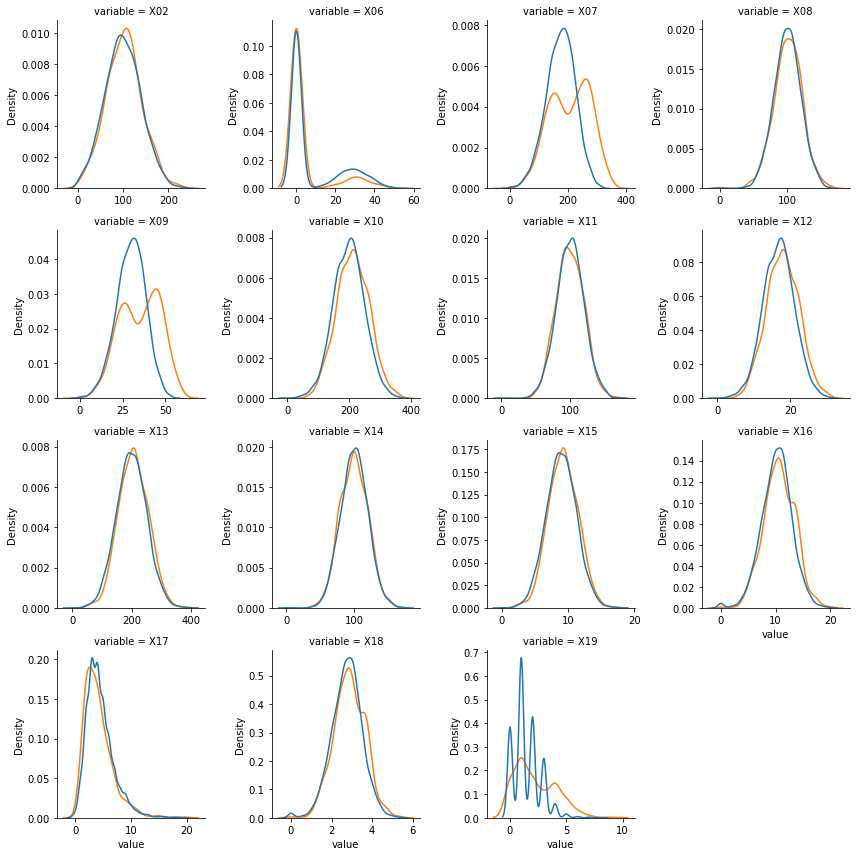

In [24]:
g = sns.FacetGrid(data= lf_num, col='variable', col_wrap=4, sharex=False, sharey=False)

g.map_dataframe(sns.kdeplot, x='value', hue='churn' ,common_norm=False)

plt.show()

The `X06` distribution is odd!

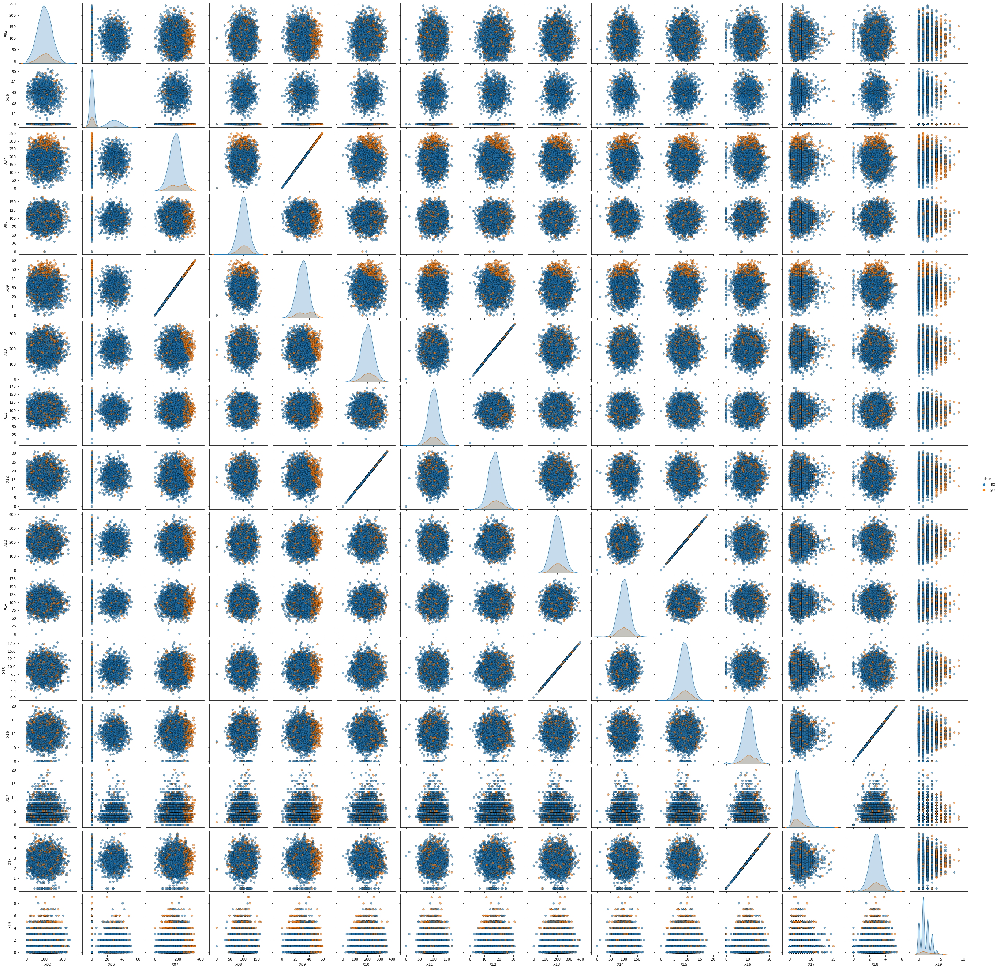

In [25]:
sns.pairplot(data=df, hue='churn', diag_kind = 'kde', plot_kws = {'alpha':0.6, 's':30, 'edgecolor':'k'})

plt.show()

In `X07` and `x09` we can distinguish that the no responses are on the right side

## Correlation

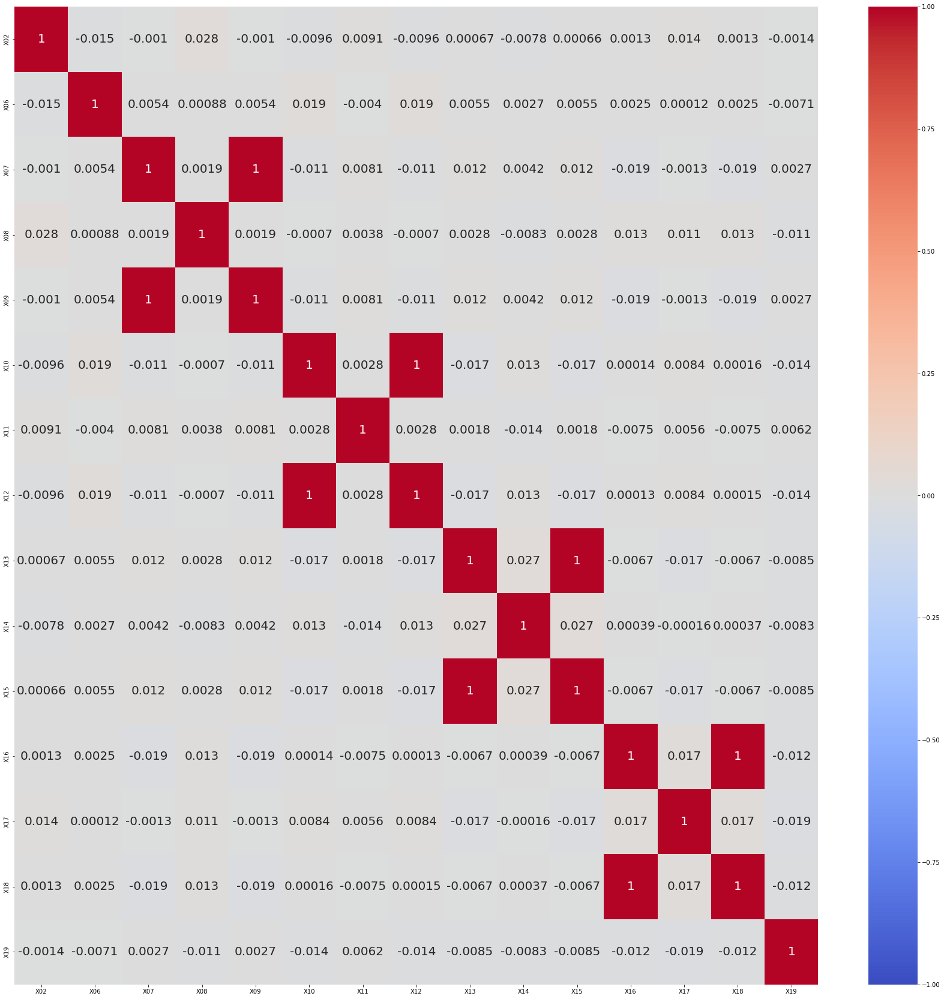

In [26]:
fig, ax = plt.subplots(figsize=(30,30))

sns.heatmap(data = df.corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm',
            annot=True, annot_kws={'size': 20},
            ax=ax)

plt.show()

From the above figure we can observe that 
* X07 and X09
* X10 and X12
* X13 and X15 
* X16 and X18

are in perfect correlation. That is they move in same direction together.

# Clustering

In [27]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.cluster import hierarchy

Converting the variable `X19` into categorical and treating `X06` and `X17` continuous

In [28]:
df['lump_x19'] = np.where( df.X19 > 3, 'Other', df.X19.astype('str'))

In [29]:
df['X06_trans'] = np.log(df.X06 + 0.001)

In [30]:
df = df.drop(columns=['X06', 'X19', 'lump_19'])

In [31]:
df_clean = df.select_dtypes('number').copy()

In [32]:
X = StandardScaler().fit_transform(df_clean)

In [33]:
df_stand = pd.DataFrame(X, columns=df_clean.columns)

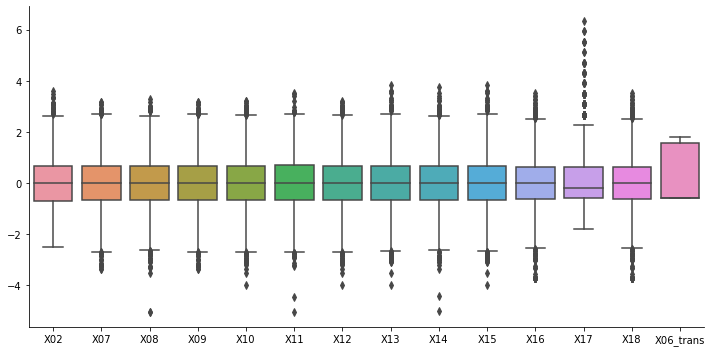

In [34]:
sns.catplot(data = pd.DataFrame(X, columns=df_clean.columns), kind='box', aspect=2)

plt.show()

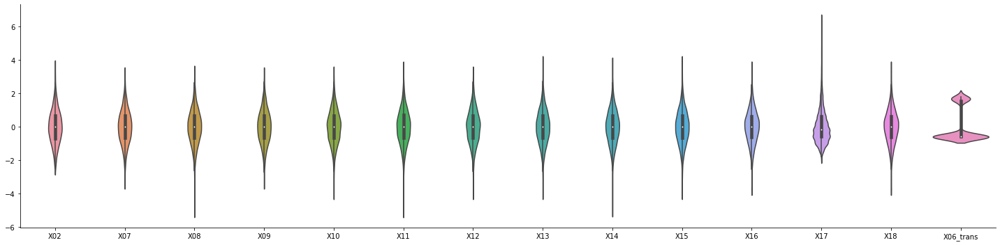

In [35]:
sns.catplot(data = pd.DataFrame(X, columns=df_clean.columns), kind='violin', aspect=4)

plt.show()

In [36]:
tots_within = []

K = range(1, 26)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit(X)
    tots_within.append(km.inertia_)

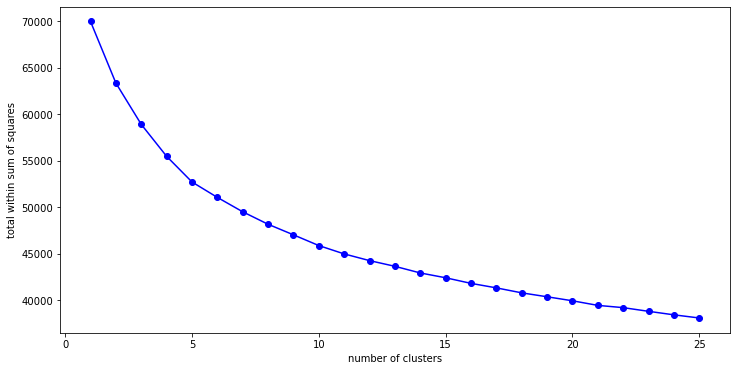

In [37]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(K, tots_within, 'bo-')
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

In [38]:
from sklearn.metrics import silhouette_score

In [39]:
sil_coef = []

K = range(2, 31)

for k in K:
    k_label = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500).fit_predict( X )
    sil_coef.append( silhouette_score(X, k_label) )

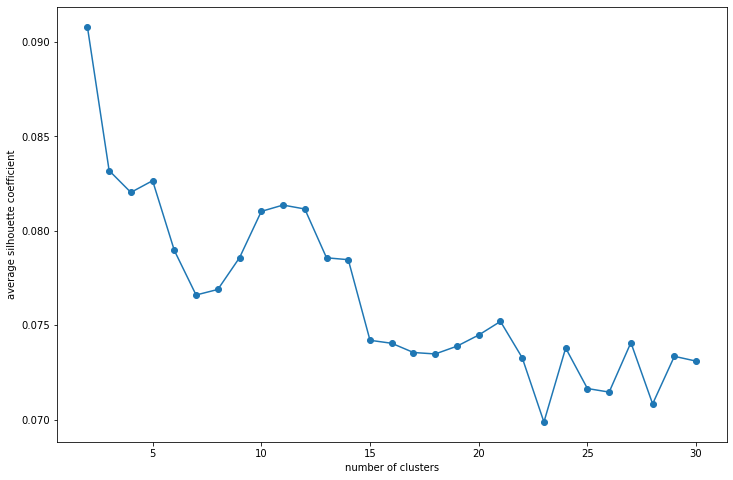

In [40]:
fig, ax = plt.subplots(figsize=(12, 8))

ax.plot(K, sil_coef, 'o-')
ax.set_xlabel('number of clusters')
ax.set_ylabel('average silhouette coefficient')

plt.show()


From this we cannot confirm how many clusters we have to take.

### PCA

In [41]:
from sklearn.decomposition import PCA

In [42]:
churn_pcs = PCA(n_components=2).fit_transform( X )

In [43]:
churn_pcs_df = pd.DataFrame( churn_pcs, columns=['pc_01', 'pc_02'])

In [44]:
churn_pcs_df['churn'] = df.churn

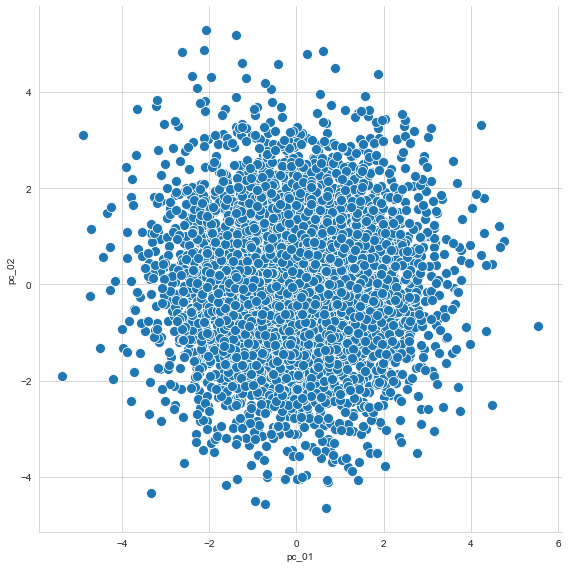

In [45]:
sns.set_style('whitegrid')

sns.relplot(data = churn_pcs_df, x='pc_01', y='pc_02', s=100, height=8)

plt.show()

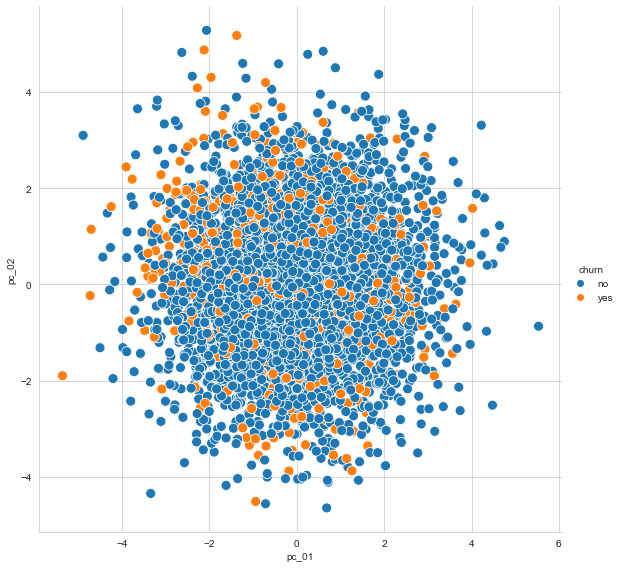

In [46]:
sns.relplot(data = churn_pcs_df, x='pc_01', y='pc_02', hue='churn', s=100, height=8)

plt.show()

### Hierarchical clustering

##### Ward method

In [47]:
hclust_ward = hierarchy.ward( X )

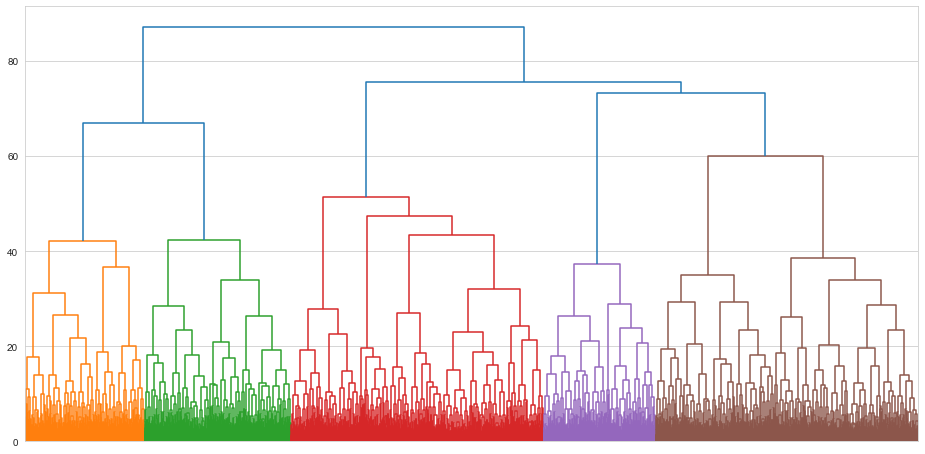

In [48]:
fig = plt.figure(figsize=(16,8))

dn = hierarchy.dendrogram( hclust_ward, no_labels=True )

plt.show()

Form this we can confirm that we have to take 5 clusters.

##### Cut the tree

In [49]:
ward_cut_5 = hierarchy.cut_tree( hclust_ward, n_clusters=5 )

In [50]:
churn_pcs_df['hclust_5'] = pd.Series( ward_cut_5.ravel(), index=churn_pcs_df.index)

churn_pcs_df['hclust_5'] = churn_pcs_df.hclust_5.astype('category')

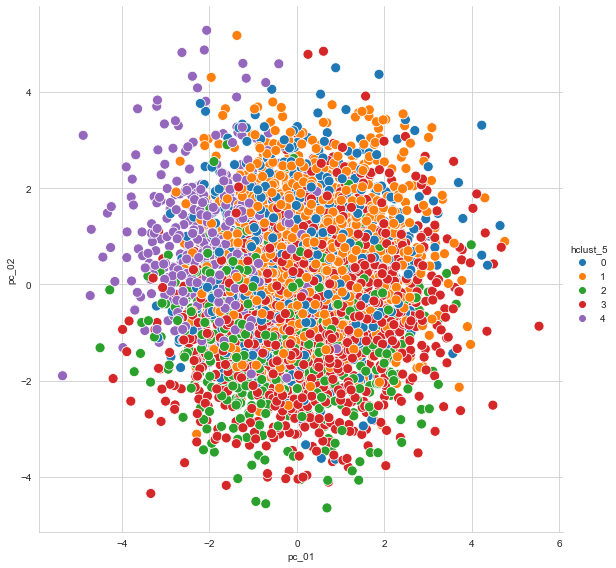

In [51]:
sns.relplot(data = churn_pcs_df, x='pc_01', y='pc_02', hue='hclust_5', s=100, height=8)

plt.show()

# Elastic Net

In [52]:
from sklearn.model_selection import RepeatedStratifiedKFold

from sklearn.linear_model import LogisticRegression

In [53]:
from sklearn.pipeline import Pipeline

In [54]:
from sklearn.model_selection import cross_val_score

In [55]:
my_cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=3, random_state=101)

Case : When Treating `X19` as categorical and `X17` and  `X06` as continuous

In [56]:
df_6 = pd.read_csv('ppg_churn.csv')

In [57]:
df_6['lump_x19'] = np.where( df_6.X19 > 3, 'Other', df_6.X19.astype('str'))

In [58]:
df_6['X06_trans'] = np.log(df_6.X06 + 0.001)

In [59]:
df_6 = df_6.drop(columns=['X06', 'X19'])

In [60]:
xinputs_6 = df_6.select_dtypes('number').copy()
youtput_6 = df_6.loc[:, ['churn']].copy()

X_train_6 = xinputs_6.to_numpy()
y_train_6 = youtput_6.churn.to_numpy().ravel()

In [61]:
enet_default_6 = LogisticRegression(penalty='elasticnet', solver='saga', random_state=101, max_iter=10001,
                                  C=1.0, l1_ratio=0.5)

default_enet_wflow_6 = Pipeline( steps=[('std_inputs', StandardScaler()), 
                                      ('enet', enet_default_6)] )

enet_default_cv_6 = cross_val_score(default_enet_wflow_6, X_train_6, y_train_6, cv=my_cv)

enet_default_cv_6

enet_default_cv_6.mean()

0.8661333333333333

In [62]:
from sklearn.model_selection import GridSearchCV

From the Eastic net results we get the beset result when we treat the `X19` variable as categorical and `X17` and `X06` as continuous

# Models Interpretation

In [63]:
df_mod = df.copy()

In [64]:
df_mod['churn'] = np.where(df.churn=='yes', 1, 0)

In [65]:
num_inputs_1 = df.select_dtypes('number').copy().columns.to_list()

In [66]:
lf_num_1 = df_mod.melt(id_vars=['churn','X03','X04','X05'], value_vars = num_inputs_1, ignore_index=True)

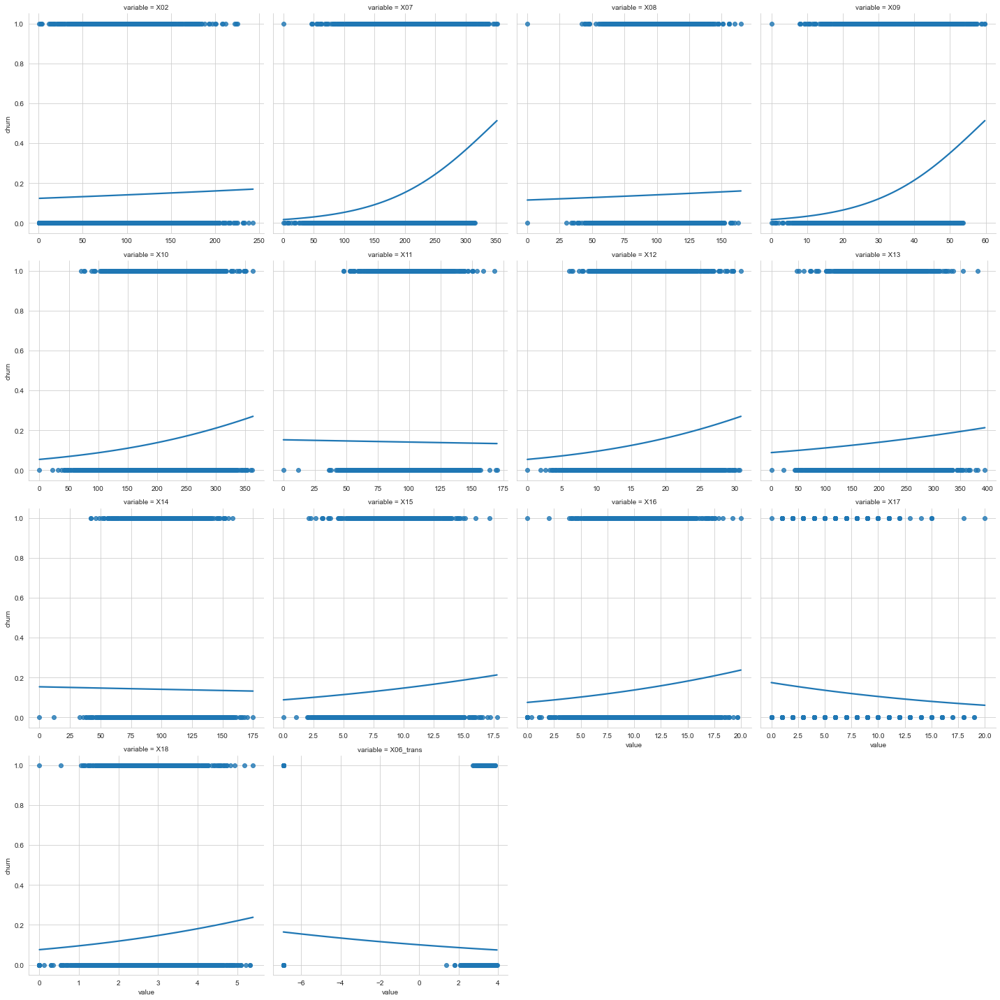

In [67]:
sns.lmplot(data = lf_num_1, x='value', y='churn', col='variable', logistic=True, col_wrap=4, ci=None,
           facet_kws={'sharey':True, 'sharex':False})

plt.show()

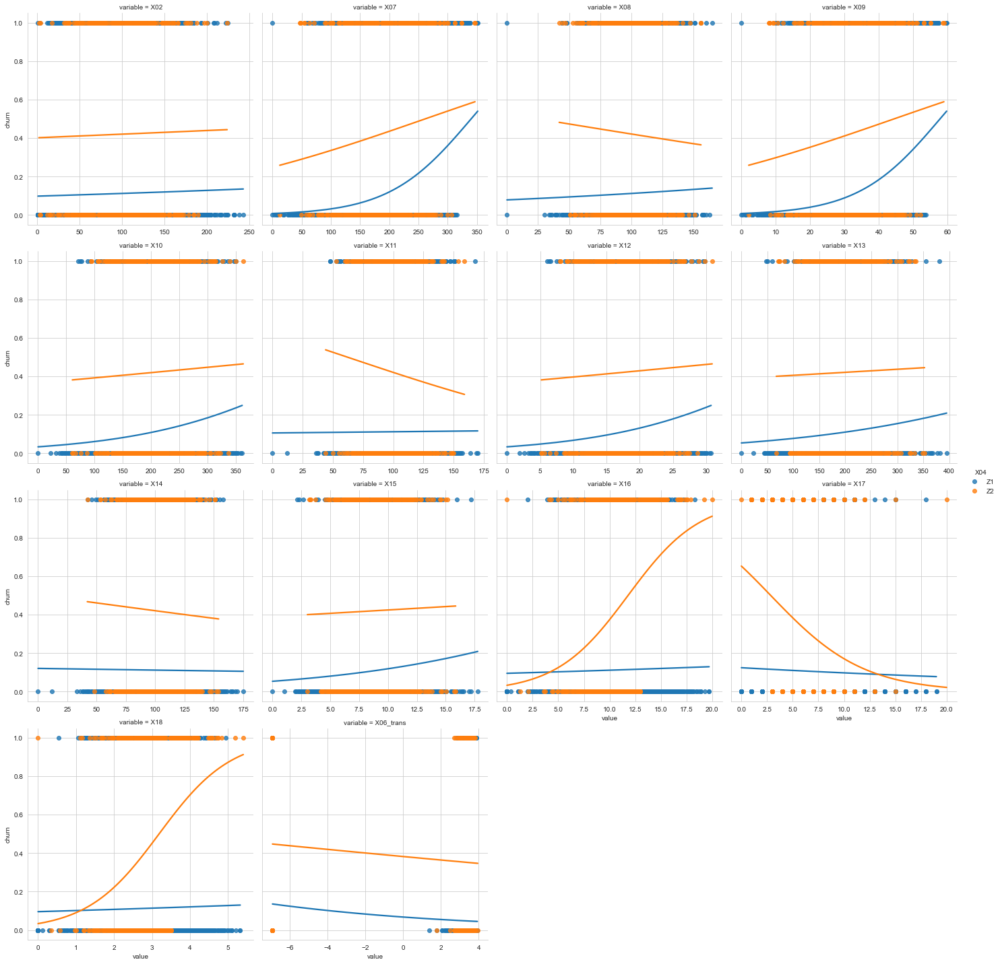

In [68]:
sns.lmplot(data = lf_num_1, x='value', y='churn', col='variable', hue='X04', logistic=True, col_wrap=4, ci=None,
           facet_kws={'sharey':True, 'sharex':False})

plt.show()

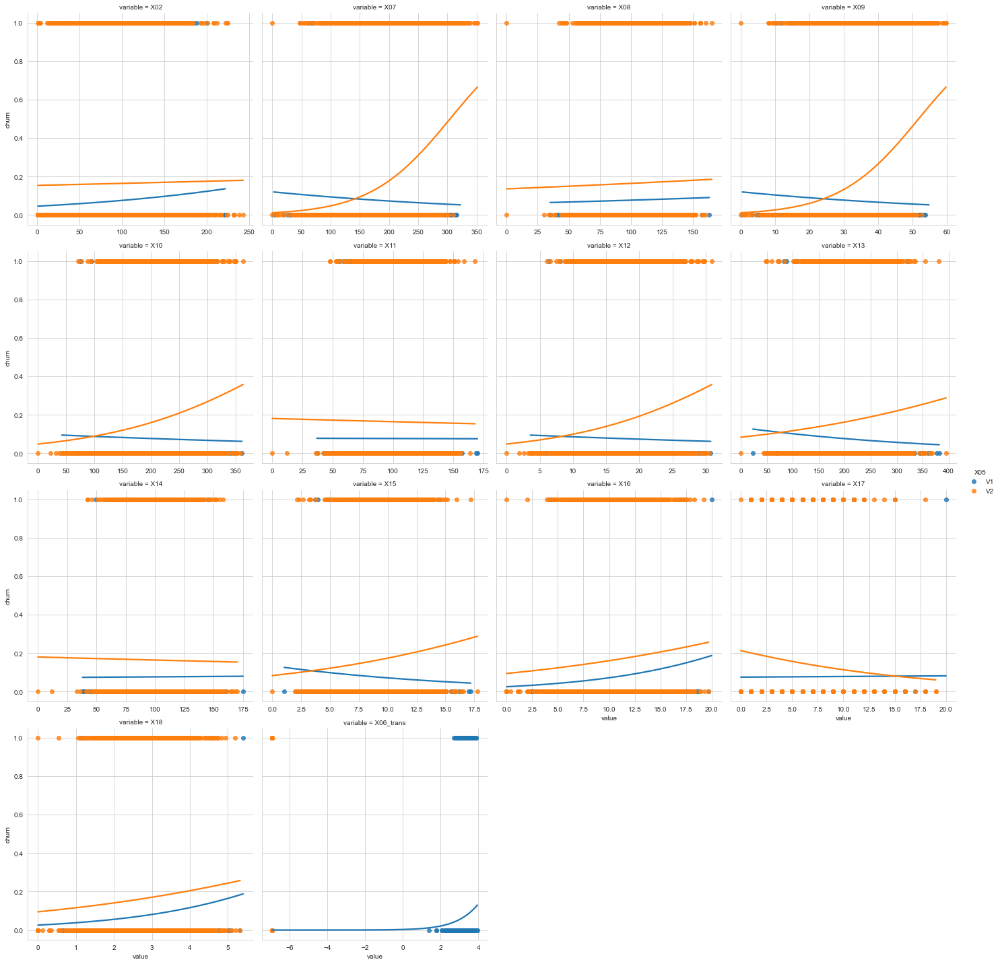

In [69]:
sns.lmplot(data = lf_num_1, x='value', y='churn', col='variable', hue='X05', logistic=True, col_wrap=4, ci=None,
           facet_kws={'sharey':True, 'sharex':False})

plt.show()

In [70]:
df_main = df_stand.copy()

In [71]:
df_main['churn'] = df_mod.churn.copy()
df_main['state'] = df.state.copy()
df_main['X03'] = df.X03.copy()
df_main['X04'] = df.X04.copy()
df_main['X05'] = df.X05.copy()
df_main['lump_X19'] = df.lump_x19.copy()

In [72]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 20 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   X02        5000 non-null   float64
 1   X07        5000 non-null   float64
 2   X08        5000 non-null   float64
 3   X09        5000 non-null   float64
 4   X10        5000 non-null   float64
 5   X11        5000 non-null   float64
 6   X12        5000 non-null   float64
 7   X13        5000 non-null   float64
 8   X14        5000 non-null   float64
 9   X15        5000 non-null   float64
 10  X16        5000 non-null   float64
 11  X17        5000 non-null   float64
 12  X18        5000 non-null   float64
 13  X06_trans  5000 non-null   float64
 14  churn      5000 non-null   int32  
 15  state      5000 non-null   object 
 16  X03        5000 non-null   object 
 17  X04        5000 non-null   object 
 18  X05        5000 non-null   object 
 19  lump_X19   5000 non-null   object 
dtypes: float

In [73]:
import statsmodels.formula.api as smf

In [74]:
formula_1 = 'churn ~ X02 + X07 + X08 + X09 + X10 + X11 + X12 + X13 + X14 + X15 + X16 + X17 + X18 + X06_trans'

formula_2 = 'churn ~ (X02 + X07 + X08 + X09 + X10 + X11 + X12 + X13 + X14 + X15 + X16 + X17 + X18 + X06_trans) ** 2'

formula_3 = 'churn ~ state + X03 + X04 + X05 + lump_X19'

formula_4 = 'churn ~ X02 + X07 + X08 + X09 + X10 + X11 + X12 + X13 + X14 + X15 + X16 + X17 + X18 + X06_trans + state + X03 + X04 + X05 + lump_X19'

formula_5 = 'churn ~ (X02 + X07 + X08 + X09 + X10 + X11 + X12 + X13 + X14 + X15 + X16 + X17 + X18 + X06_trans) * (state + X03 + X04 + X05 + lump_X19)'

formula_6 = 'churn ~ np.power(X02, 2) + np.power(X07, 2) + np.power(X08, 2) + np.power(X09, 2) + np.power(X10, 2) + np.power(X11, 2) + np.power(X12, 2) + np.power(X13, 2) + np.power(X14, 2) + np.power(X15, 2) + np.power(X16, 2) + np.power(X17, 2) + np.power(X18, 2) + np.power(X06_trans, 2) '

formula_7 = 'churn ~ np.power(X02, 4) + np.power(X07, 4) + np.power(X08, 4) + np.power(X09, 4) + np.power(X10, 4) + np.power(X11, 4) + np.power(X12, 4) + np.power(X13, 4) + np.power(X14, 4) + np.power(X15, 4) + np.power(X16, 4) + np.power(X17, 4) + np.power(X18, 4) + np.power(X06_trans, 4)'

formula_8 = 'churn ~ np.power(X02, 2) + np.power(X07, 2) + np.power(X08, 2) + np.power(X09, 2) + np.power(X10, 2) + np.power(X11, 2) + np.power(X12, 2) + np.power(X13, 2) + np.power(X14, 2) + np.power(X15, 2) + np.power(X16, 2) + np.power(X17, 2) + np.power(X18, 2) + np.power(X06_trans, 2) + (X02 + X07 + X08 + X09 + X10 + X11 + X12 + X13 + X14 + X15 + X16 + X17 + X18 + X06_trans ) * (state + X03 + X04 + X05 + lump_X19)'

In [75]:
def my_coefplot(model_object, figsize_use=(10,5)):
    fig, ax = plt.subplots(figsize=figsize_use)
    
    ax.errorbar(y = model_object.params.index,
                x = model_object.params,
                xerr = 2 * model_object.bse,
                fmt='o', color='black', ecolor='black',
                elinewidth=3, ms=10)
    
    ax.axvline(x=0, linestyle='--', linewidth=5, color='grey')
    
    ax.set_xlabel('coefficient value')
    
    plt.show()

In [76]:
fit_01 = smf.logit(formula = formula_1, data = df_main).fit()

Optimization terminated successfully.
         Current function value: 0.368005
         Iterations 9


In [77]:
print( fit_01.summary() )

                           Logit Regression Results                           
Dep. Variable:                  churn   No. Observations:                 5000
Model:                          Logit   Df Residuals:                     4985
Method:                           MLE   Df Model:                           14
Date:                Tue, 14 Dec 2021   Pseudo R-squ.:                 0.09691
Time:                        19:42:22   Log-Likelihood:                -1840.0
converged:                       True   LL-Null:                       -2037.5
Covariance Type:            nonrobust   LLR p-value:                 1.493e-75
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -2.0569      0.050    -41.536      0.000      -2.154      -1.960
X02            0.0659      0.042      1.559      0.119      -0.017       0.149
X07          188.8316    135.603      1.393      0.1

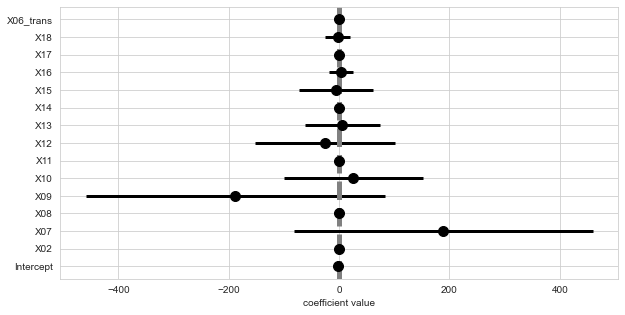

In [78]:
my_coefplot(fit_01)

In [79]:
fit_03 = smf.logit(formula = formula_3, data = df_main).fit()

Optimization terminated successfully.
         Current function value: 0.328347
         Iterations 7


In [80]:
print( fit_03.summary() )

                           Logit Regression Results                           
Dep. Variable:                  churn   No. Observations:                 5000
Model:                          Logit   Df Residuals:                     4941
Method:                           MLE   Df Model:                           58
Date:                Tue, 14 Dec 2021   Pseudo R-squ.:                  0.1942
Time:                        19:42:23   Log-Likelihood:                -1641.7
converged:                       True   LL-Null:                       -2037.5
Covariance Type:            nonrobust   LLR p-value:                2.535e-129
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            -3.9189      0.514     -7.618      0.000      -4.927      -2.911
state[T.AL]           0.4004      0.588      0.681      0.496      -0.751       1.552
state[T.AR]           0.

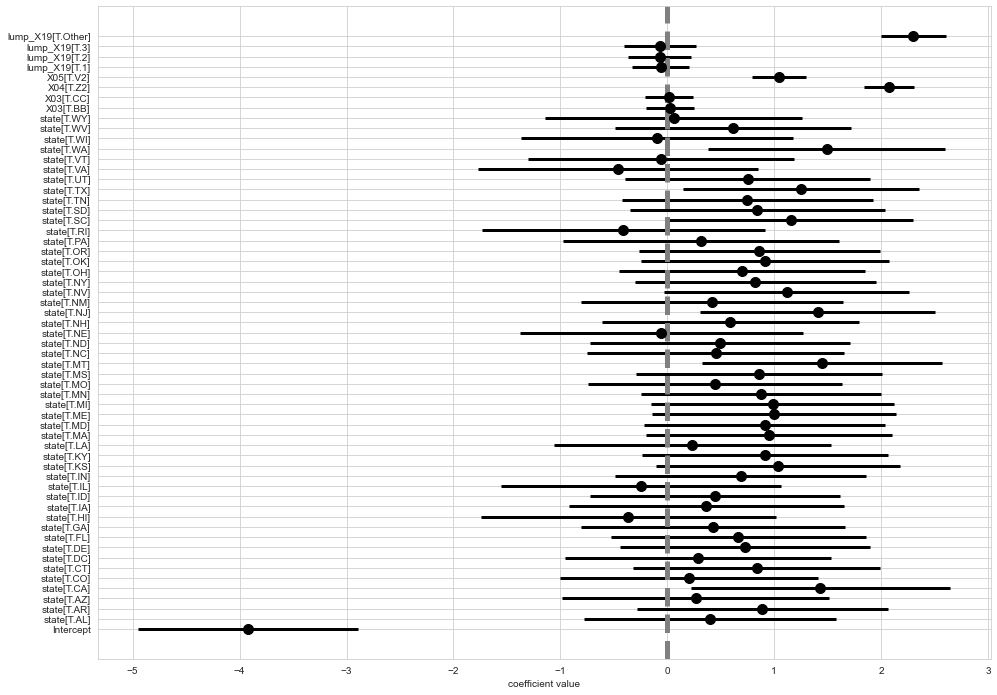

In [81]:
my_coefplot(fit_03, figsize_use=(16, 12))

In [82]:
fit_04 = smf.logit(formula = formula_4, data = df_main).fit()

Optimization terminated successfully.
         Current function value: 0.290285
         Iterations 10


In [83]:
print( fit_04.summary() )

                           Logit Regression Results                           
Dep. Variable:                  churn   No. Observations:                 5000
Model:                          Logit   Df Residuals:                     4927
Method:                           MLE   Df Model:                           72
Date:                Tue, 14 Dec 2021   Pseudo R-squ.:                  0.2876
Time:                        19:42:24   Log-Likelihood:                -1451.4
converged:                       True   LL-Null:                       -2037.5
Covariance Type:            nonrobust   LLR p-value:                2.337e-198
                        coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept           -13.9097      3.575     -3.891      0.000     -20.917      -6.903
state[T.AL]           0.2382      0.605      0.394      0.694      -0.948       1.424
state[T.AR]           0.

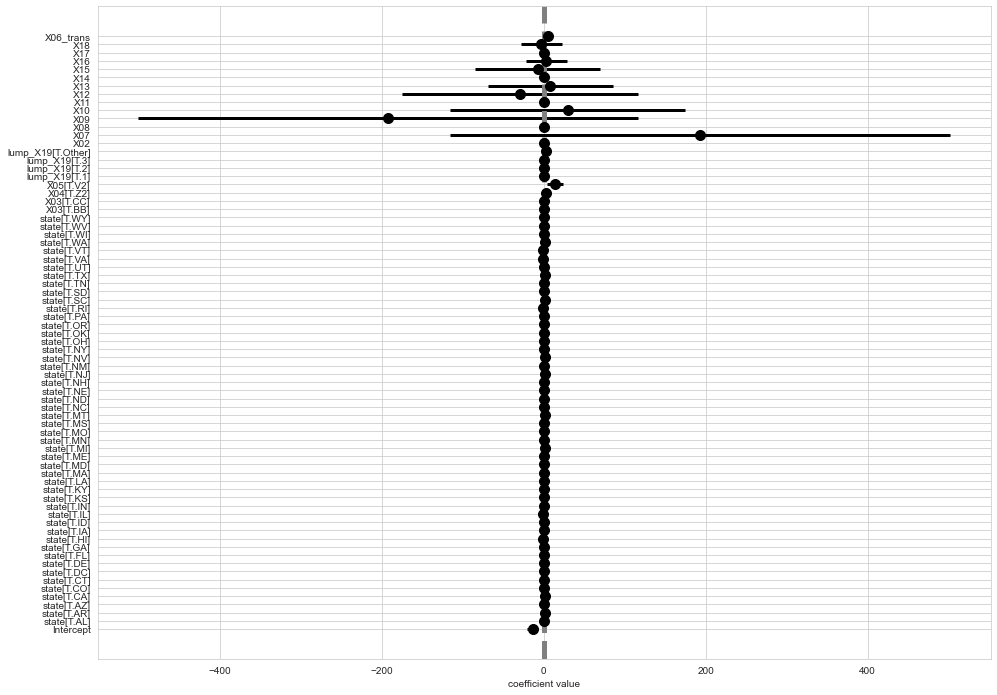

In [84]:
my_coefplot(fit_04, figsize_use=(16, 12))

In [85]:
fit_06 = smf.logit(formula = formula_6, data = df_main).fit()

Optimization terminated successfully.
         Current function value: 0.375739
         Iterations 8


In [86]:
print( fit_06.summary() )

                           Logit Regression Results                           
Dep. Variable:                  churn   No. Observations:                 5000
Model:                          Logit   Df Residuals:                     4985
Method:                           MLE   Df Model:                           14
Date:                Tue, 14 Dec 2021   Pseudo R-squ.:                 0.07793
Time:                        19:42:25   Log-Likelihood:                -1878.7
converged:                       True   LL-Null:                       -2037.5
Covariance Type:            nonrobust   LLR p-value:                 2.535e-59
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -2.0577      0.101    -20.309      0.000      -2.256      -1.859
np.power(X02, 2)          -0.0062      0.031     -0.202      0.840      -0.066       0.054
np.p

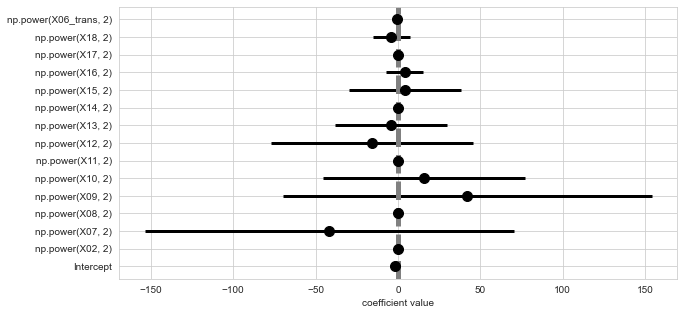

In [87]:
my_coefplot(fit_06)

In [88]:
fit_07 = smf.logit(formula = formula_7, data = df_main).fit()

Optimization terminated successfully.
         Current function value: 0.386547
         Iterations 6


In [89]:
print( fit_07.summary() )

                           Logit Regression Results                           
Dep. Variable:                  churn   No. Observations:                 5000
Model:                          Logit   Df Residuals:                     4985
Method:                           MLE   Df Model:                           14
Date:                Tue, 14 Dec 2021   Pseudo R-squ.:                 0.05141
Time:                        19:42:25   Log-Likelihood:                -1932.7
converged:                       True   LL-Null:                       -2037.5
Covariance Type:            nonrobust   LLR p-value:                 6.280e-37
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                 -1.7845      0.059    -30.478      0.000      -1.899      -1.670
np.power(X02, 4)           0.0006      0.005      0.133      0.894      -0.009       0.010
np.p

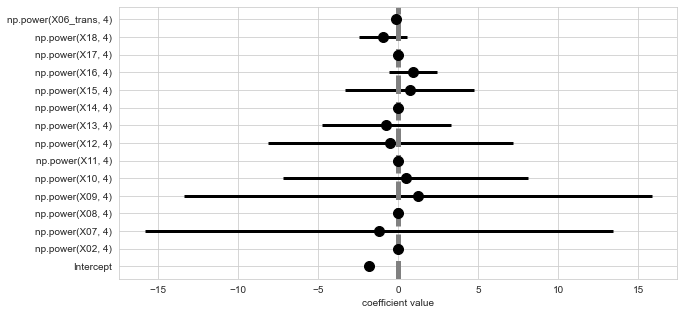

In [90]:
my_coefplot(fit_07)

In [91]:
mod_list = [fit_01, fit_03, fit_04, fit_06, fit_07]

In [92]:
df_copy_b = df_main.copy()

In [93]:
for i, mod in enumerate(mod_list):
    df_copy_b['pred_probability_'+str(i+1).zfill(2)] = mod.predict(df_main)

In [94]:
for i in range(len(mod_list)):
    df_copy_b['pred_class_'+str(i+1).zfill(2)] = np.where( df_copy_b['pred_probability_'+str(i+1).zfill(2)] > 0.5, 1, 0)

In [95]:
model_accuracy = []

for i in range(len(mod_list)):
    model_accuracy.append( df_copy_b.loc[ df_copy_b.churn == df_copy_b['pred_class_'+str(i+1).zfill(2)] ].shape[0] / df_copy_b.shape[0])

In [96]:
model_accuracy

[0.8668, 0.8706, 0.8604, 0.8592, 0.859]

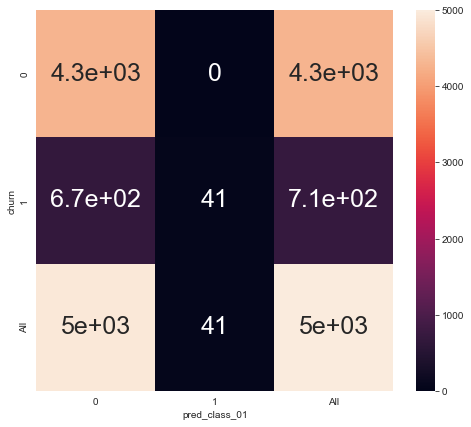

In [97]:
fig, ax = plt.subplots(figsize=(8,7))

sns.heatmap(pd.crosstab(df_copy_b.churn, df_copy_b.pred_class_01, margins=True),
            annot=True, annot_kws={'size': 25},
            ax=ax)

plt.show()


##### ROC Curve

In [98]:
from sklearn.metrics import roc_curve

In [99]:
def roc_values(mod_id, df_object):
    fpr, tpr, threshold = roc_curve(df_object.churn.to_numpy(), df_object['pred_probability_'+str(mod_id+1).zfill(2)].to_numpy())
    res = pd.DataFrame({'fpr': fpr, 'tpr': tpr, 'threshold': threshold})
    res['model_name'] = 'fit_'+str(mod_id+1).zfill(2)
    
    return res

In [100]:
all_roc_curves = []

for i in range(len(mod_list)):
    all_roc_curves.append( roc_values(i, df_copy_b) )

In [101]:
all_roc_df = pd.concat(all_roc_curves).reset_index()

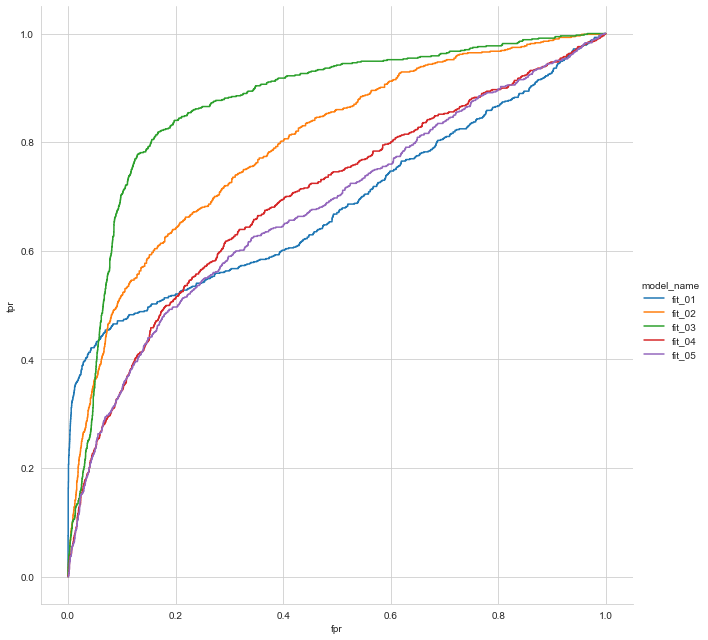

In [102]:
sns.relplot(data = all_roc_df, x='fpr', y='tpr', hue='model_name',
            estimator=None, units='model_name',
            kind='line',
            drawstyle='steps-post',
            height=9)

plt.show()

# Model Performance and Validation

In [103]:
from patsy import dmatrices
from sklearn.linear_model import LogisticRegression

In [104]:
from sklearn.model_selection import cross_val_score

In [105]:
y_07, X_07 = dmatrices(formula_7 + ' - 1', data = df_main)

In [106]:
from sklearn.linear_model import LogisticRegressionCV

In [107]:
ridge_tune_results = LogisticRegressionCV(penalty='l2', Cs=101, cv=my_cv, solver='lbfgs', max_iter=5001, fit_intercept=False).\
fit(X_07, y_07.ravel())

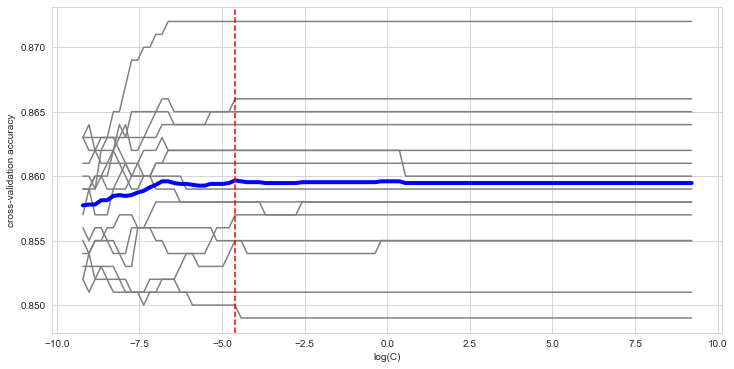

In [108]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(np.log(ridge_tune_results.Cs_), ridge_tune_results.scores_[1.0].T, color='grey')
ax.plot(np.log(ridge_tune_results.Cs_), ridge_tune_results.scores_[1.0].mean(axis=0), color='blue', linewidth=4)
ax.axvline(x=np.log(ridge_tune_results.C_), color='red', linestyle='dashed')
ax.set_xlabel('log(C)')
ax.set_ylabel("cross-validation accuracy")

plt.show()

In [109]:
lasso_tune_results = LogisticRegressionCV(penalty='l1', Cs=101, cv=my_cv, solver='saga', max_iter=5001, fit_intercept=False).\
fit(X_07, y_07.ravel())

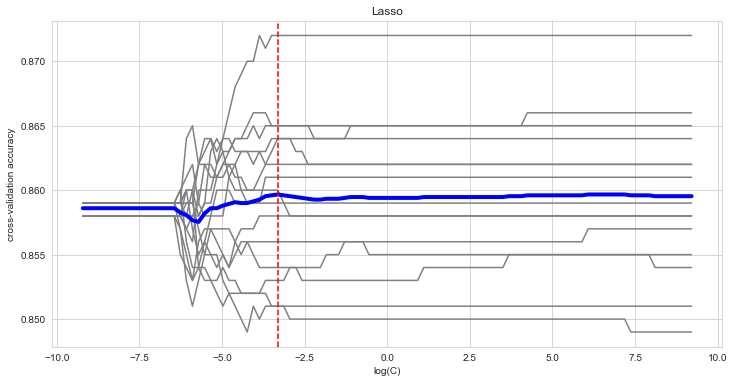

In [110]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(np.log(lasso_tune_results.Cs_), lasso_tune_results.scores_[1.0].T, color='grey')
ax.plot(np.log(lasso_tune_results.Cs_), lasso_tune_results.scores_[1.0].mean(axis=0), color='blue', linewidth=4)
ax.axvline(x=np.log(lasso_tune_results.C_), color='red', linestyle='dashed')
ax.set_xlabel('log(C)')
ax.set_ylabel("cross-validation accuracy")
ax.set_title("Lasso")

plt.show()

In [111]:
print( ridge_tune_results.coef_)

[[-0.05411725  0.00833876 -0.01402398  0.00996263 -0.0187401  -0.0571266
  -0.01910932 -0.025187   -0.05939367 -0.02432039 -0.00739607 -0.00144733
  -0.01872073 -0.25064314]]


In [112]:
print( lasso_tune_results.coef_ )

[[-0.05363926  0.00853042 -0.0139784   0.008941   -0.01863751 -0.05632129
  -0.01870365 -0.02478074 -0.05858329 -0.02406857 -0.00782969 -0.00145634
  -0.01795627 -0.24481768]]


In [113]:
y_06, X_06 = dmatrices(formula_6 + ' - 1', data = df_main)

In [114]:
ridge_tune_results_6 = LogisticRegressionCV(penalty='l2', Cs=101, cv=my_cv, solver='lbfgs', max_iter=5001, fit_intercept=False).\
fit(X_06, y_06.ravel())

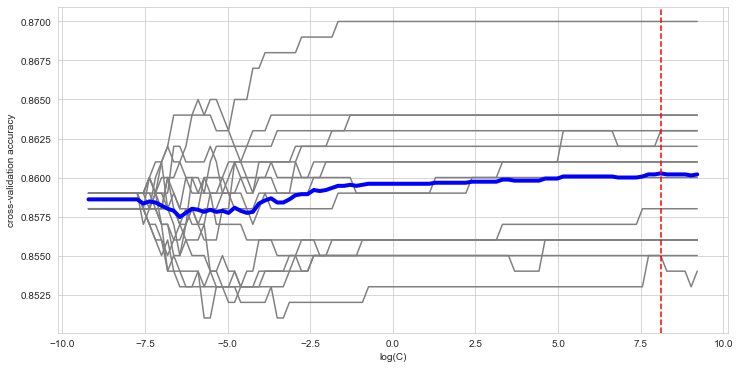

In [115]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(np.log(ridge_tune_results_6.Cs_), ridge_tune_results_6.scores_[1.0].T, color='grey')
ax.plot(np.log(ridge_tune_results_6.Cs_), ridge_tune_results_6.scores_[1.0].mean(axis=0), color='blue', linewidth=4)
ax.axvline(x=np.log(ridge_tune_results_6.C_), color='red', linestyle='dashed')
ax.set_xlabel('log(C)')
ax.set_ylabel("cross-validation accuracy")

plt.show()

In [116]:
lasso_tune_results_6 = LogisticRegressionCV(penalty='l1', Cs=101, cv=my_cv, solver='saga', max_iter=5001, fit_intercept=False).\
fit(X_06, y_06.ravel())

C:\Users\Vedant\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "
C:\Users\Vedant\anaconda3\envs\cmpinf2100\lib\site-packages\sklearn\linear_model\_sag.py:328: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn("The max_iter was reached which means "


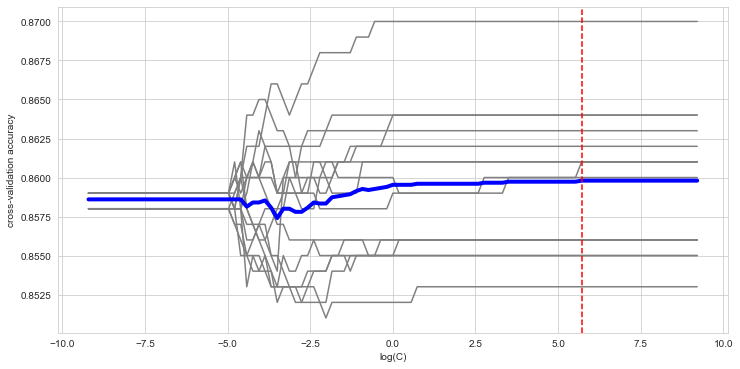

In [117]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(np.log(lasso_tune_results_6.Cs_), lasso_tune_results_6.scores_[1.0].T, color='grey')
ax.plot(np.log(lasso_tune_results_6.Cs_), lasso_tune_results_6.scores_[1.0].mean(axis=0), color='blue', linewidth=4)
ax.axvline(x=np.log(lasso_tune_results_6.C_), color='red', linestyle='dashed')
ax.set_xlabel('log(C)')
ax.set_ylabel("cross-validation accuracy")

plt.show()

In [118]:
print( ridge_tune_results.coef_)

[[-0.05411725  0.00833876 -0.01402398  0.00996263 -0.0187401  -0.0571266
  -0.01910932 -0.025187   -0.05939367 -0.02432039 -0.00739607 -0.00144733
  -0.01872073 -0.25064314]]


In [119]:
print( lasso_tune_results.coef_ )

[[-0.05363926  0.00853042 -0.0139784   0.008941   -0.01863751 -0.05632129
  -0.01870365 -0.02478074 -0.05858329 -0.02406857 -0.00782969 -0.00145634
  -0.01795627 -0.24481768]]


In [120]:
y_03, X_03 = dmatrices(formula_3 + ' - 1', data = df_main)

In [121]:
ridge_tune_results_3 = LogisticRegressionCV(penalty='l2', Cs=101, cv=my_cv, solver='lbfgs', max_iter=5001, fit_intercept=False).\
fit(X_03, y_03.ravel())

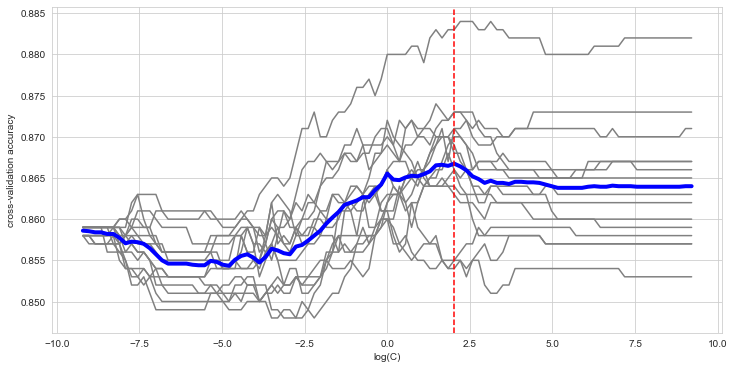

In [122]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(np.log(ridge_tune_results_3.Cs_), ridge_tune_results_3.scores_[1.0].T, color='grey')
ax.plot(np.log(ridge_tune_results_3.Cs_), ridge_tune_results_3.scores_[1.0].mean(axis=0), color='blue', linewidth=4)
ax.axvline(x=np.log(ridge_tune_results_3.C_), color='red', linestyle='dashed')
ax.set_xlabel('log(C)')
ax.set_ylabel("cross-validation accuracy")

plt.show()

In [123]:
lasso_tune_results_3 = LogisticRegressionCV(penalty='l1', Cs=101, cv=my_cv, solver='saga', max_iter=5001, fit_intercept=False).\
fit(X_03, y_03.ravel())

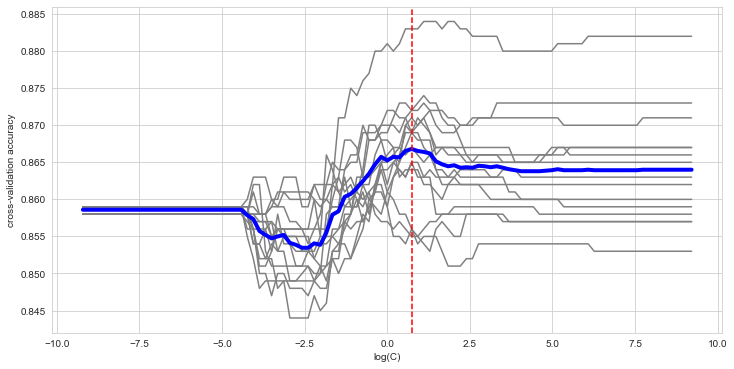

In [124]:
fig, ax = plt.subplots(figsize=(12, 6))

ax.plot(np.log(lasso_tune_results_3.Cs_), lasso_tune_results_3.scores_[1.0].T, color='grey')
ax.plot(np.log(lasso_tune_results_3.Cs_), lasso_tune_results_3.scores_[1.0].mean(axis=0), color='blue', linewidth=4)
ax.axvline(x=np.log(lasso_tune_results_3.C_), color='red', linestyle='dashed')
ax.set_xlabel('log(C)')
ax.set_ylabel("cross-validation accuracy")

plt.show()

In [125]:
print( ridge_tune_results.coef_)

[[-0.05411725  0.00833876 -0.01402398  0.00996263 -0.0187401  -0.0571266
  -0.01910932 -0.025187   -0.05939367 -0.02432039 -0.00739607 -0.00144733
  -0.01872073 -0.25064314]]


In [126]:
print( lasso_tune_results.coef_ )

[[-0.05363926  0.00853042 -0.0139784   0.008941   -0.01863751 -0.05632129
  -0.01870365 -0.02478074 -0.05858329 -0.02406857 -0.00782969 -0.00145634
  -0.01795627 -0.24481768]]


As the varialbes are highly correlated the lasso penalty does not work properly. We can also validate this result from the result of elastic net where we get the best result when lasso penalty is set to zero.